In [1]:
import os
import subprocess
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torchaudio
import matplotlib.pyplot as plt
import sklearn
from IPython.display import Audio, display
import tqdm
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import LinearSVC, SVC
from ae_ideal.DataPreprocessor import DataPreprocessor

In [2]:
ESC_ROOT = Path("data/ESC-50-master")
META_CSV = ESC_ROOT / "meta" / "esc50.csv"
AUDIO_DIR = ESC_ROOT / "audio"
device = "cuda" if torch.cuda.is_available() else "mps" if torch.mps.is_available() else "cpu"
to_latent = DataPreprocessor().to_latent

In [3]:
def get_git_branch():
    """通过 subprocess 获取当前 git 分支名称"""
    try:
        branch = subprocess.check_output(
            ["git", "rev-parse", "--abbrev-ref", "HEAD"]
        ).decode("utf-8").strip()
        return branch
    except Exception as e:
        print(f"Warning: Could not detect git branch ({e}). Using 'unknown'.")
        return "unknown"
autoencoder_type = "normal" if get_git_branch() == "master" else "noise" 

In [4]:
def _estimator_name(obj):
    return obj.__class__.__name__

ESC_ROOT = Path("data/ESC-50-master")
META_CSV = ESC_ROOT / "meta" / "esc50.csv"
AUDIO_DIR = ESC_ROOT / "audio"

@torch.no_grad()
def build_latent_table_batched(
    meta_csv_path=META_CSV,
    audio_dir=AUDIO_DIR,
    batch_size=64,
    num_workers=2,          # Mac 上一般 2~8 都可试；Jupyter 若报多进程问题就改 0
    limit=None,
    pad_value=0.0,
):
    meta = pd.read_csv(meta_csv_path)
    if "filename" not in meta.columns or "category" not in meta.columns:
        raise ValueError(f"meta csv columns: {list(meta.columns)} (need filename/category)")

    if limit is not None:
        meta = meta.iloc[:limit].copy()

    class _EscDataset(torch.utils.data.Dataset):
        def __init__(self, df, audio_dir):
            self.df = df.reset_index(drop=True)
            self.audio_dir = audio_dir

        def __len__(self):
            return len(self.df)

        def __getitem__(self, idx):
            r = self.df.iloc[idx]
            path = self.audio_dir / r["filename"]
            wav, sr = torchaudio.load(str(path))  # wav: (C,T)
            if wav.dim() == 2 and wav.size(0) > 1:
                wav = wav.mean(dim=0, keepdim=True)  # (1,T)
            elif wav.dim() == 1:
                wav = wav.unsqueeze(0)  # (1,T)

            return wav, str(path), r["category"]

    def _collate(batch):
        # batch: list[(wav(1,T), path, label)]
        wavs, paths, labels = zip(*batch)
        lengths = [w.size(-1) for w in wavs]
        max_len = max(lengths)

        out = []
        for w in wavs:
            T = w.size(-1)
            if T < max_len:
                pad = torch.full((1, max_len - T), pad_value, dtype=w.dtype)
                w = torch.cat([w, pad], dim=-1)
            elif T > max_len:
                w = w[..., :max_len]
            out.append(w)
        wav_batch = torch.stack(out, dim=0)  # (B,1,T)
        return wav_batch, list(paths), list(labels)

    ds = _EscDataset(meta, audio_dir)
    dl = torch.utils.data.DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=_collate,
        drop_last=False,
        persistent_workers=(num_workers > 0),
    )

    all_paths = []
    all_labels = []
    all_latents = []

    # 推理：batch 一次性过 encoder
    with torch.inference_mode():
        for wav_batch, paths, labels in tqdm.tqdm(dl):
            wav_batch = wav_batch.to(device)  # (B,1,T)

            # 兼容 to_latent 可能期望 (B,T) 或 (B,1,T)
            try:
                z = to_latent(wav_batch)
            except Exception:
                z = to_latent(wav_batch.squeeze(1))  # (B,T)

            # 统一 reshape 到 (B,300)
            z = z.reshape(z.shape[0], -1)
            if z.shape[1] != 300:
                raise ValueError(f"latent dim != 300, got {z.shape}")

            all_paths.extend(paths)
            all_labels.extend(labels)
            all_latents.append(z.detach().cpu().numpy())

    X = np.concatenate(all_latents, axis=0)  # (N,300)
    latent_df = pd.DataFrame({
        "path": all_paths,
        "original_label": all_labels,
        "latent": list(X),
    })
    y = latent_df["original_label"].values
    return latent_df, X, y

def visualization(
    X, y,
    projector_name="",
    model=None,  # 接收任意 fit 好的聚类模型
    save_name=None,
    figsize=(8, 6),
):
    unique_labels = np.unique(y)
    cmap = plt.get_cmap("tab10", len(unique_labels))
    markers = ['o', '^', 's', 'D', 'P', 'X', '*', 'v', '<', '>']

    fig, ax = plt.subplots(figsize=figsize, dpi=300)

    # --- 1. 通用决策边界绘制 (Meshgrid + Predict) ---
    if model is not None:
        # 获取模型名称用于标题
        model_name = str(model.__class__).split('.')[-1].replace("'>", "").replace("class ", "")
        
        # 创建网格
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                             np.linspace(y_min, y_max, 200))

        # 预测网格中每个点的 Cluster ID
        # 这种方法对 KMeans, GMM, SVM 等所有支持 predict 的模型都通用
        Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)

        # 绘制背景分区 (透明度高)
        ax.contourf(xx, yy, Z, alpha=0.15, cmap='Pastel1')
        # 绘制分界线
        ax.contour(xx, yy, Z, levels=np.arange(Z.max() + 1) - 0.5, 
                   linewidths=1.5, colors='red', linestyles='--')

        # --- 2. 绘制质心 (自动适配 KMeans 和 GMM) ---
        centers = None
        if hasattr(model, 'cluster_centers_'): # KMeans
            centers = model.cluster_centers_
        elif hasattr(model, 'means_'): # GMM
            centers = model.means_
            
        if centers is not None:
            ax.scatter(centers[:, 0], centers[:, 1], s=50, c='black', marker='x', 
                       linewidths=2, zorder=10, label=f'{model_name} Centers')
            
        ax.set_title(f'{projector_name} Space with {model_name} Boundaries')
    else:
        ax.set_title(f'{projector_name} Space')

    # --- 3. 绘制真实数据散点 ---
    for idx, label in enumerate(unique_labels):
        mask = (y == label)
        ax.scatter(
            X[mask, 0], X[mask, 1],
            s=20, alpha=0.8, color=cmap(idx),
            marker=markers[idx % len(markers)],
            edgecolors='white', linewidth=0.5,
            label=str(label)
        )

    ax.set_xlabel(f'{projector_name} 1')
    ax.set_ylabel(f'{projector_name} 2')
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)
    
    # 图例
    _setup_legend(ax, n_columns=min(5, len(unique_labels)))

    if save_name:
        fig.savefig(save_name, bbox_inches='tight')

    return fig, ax


In [5]:
plt.rcParams.update({
    "font.size": 1,
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "legend.fontsize": 10,
})

def _setup_legend(ax, n_columns=5):
    """统一的图例设置辅助函数"""
    ax.legend(
        title='Class',
        loc='upper center',             # 图例的锚点：上边缘居中
        bbox_to_anchor=(0.5, -0.2),     # 放置位置：X轴中心(0.5)，Y轴下方(-0.2)
        ncol=n_columns,                 # 分5列
        borderaxespad=0.,
        frameon=False,
        columnspacing=1.0,              # 列间距
        handletextpad=0.5               # 图标与文字间距
    )

In [6]:
def _sigmoid(x):
    return 1.0 / (1.0 + np.latent_exp(-x))
class ClassifierFromCluster:
    """
    一个混合模型：
    1. 先用 base_clusterer (如 GMM) 找到聚类大概在哪。
    2. 再用 Polynomial Logistic Regression 拟合出一个平滑的决策边界（红线）。
    """
    def __init__(self, base_clusterer, classifer):
        self.base_clusterer = base_clusterer
        self.classifier = classifer
        
    def fit(self, X, y=None):
        self.base_clusterer.fit(X)
        pseudo_labels = self.base_clusterer.predict(X)
        self.classifier.fit(X, pseudo_labels)
        return self

    def predict(self, X):
        return self.classifier.predict(X)
    @property
    def means_(self):
        if hasattr(self.base_clusterer, 'means_'):
            return self.base_clusterer.means_
        if hasattr(self.base_clusterer, 'cluster_centers_'):
            return self.base_clusterer.cluster_centers_
        return None

class ClassifierFromClusterProba(ClassifierFromCluster):
    """
    在你原有 ClassifierFromCluster 基础上增加 predict_proba。
    兼容：
      - 有 predict_proba 的分类器（LogReg / SVC(probability=True) / Pipeline...）
      - 只有 decision_function 的分类器（LinearSVC / Linear models...） -> sigmoid 近似
    """
    def fit(self, X, y=None):
        super().fit(X, y=y)
        return self

    def predict_proba(self, X):
        clf = self.classifier
        if hasattr(clf, "predict_proba"):
            proba = clf.predict_proba(X)
            # 保证二分类输出 shape (N,2)
            if proba.ndim == 1:
                proba = np.stack([1 - proba, proba], axis=1)
            return proba

        if hasattr(clf, "decision_function"):
            s = clf.decision_function(X)
            # 二分类：s shape (N,) -> sigmoid
            if np.ndim(s) == 1:
                p1 = _sigmoid(s)
                return np.stack([1 - p1, p1], axis=1)
            # 多分类：softmax（这里一般用不到，但做兼容）
            s = np.array(s)
            s = s - np.max(s, axis=1, keepdims=True)
            latent_exp = np.latent_exp(s)
            return latent_exp / np.sum(latent_exp, axis=1, keepdims=True)

        raise AttributeError(f"classifier {_estimator_name(clf)} has neither predict_proba nor decision_function")


In [7]:
class LatentSpaceExperiment:
    """
    一次完整实验：
      latent(300d) -> projector(2d) -> clusterer -> classifier_from_cluster
      输出：每个 sample 的 cluster + prob + 原始路径/标签
    """
    def __init__(self, projector, base_clusterer, classifier):
        self.projector = projector
        self.base_clusterer = base_clusterer
        self.classifier = classifier
        self.model = ClassifierFromClusterProba(base_clusterer=base_clusterer, classifer=classifier)

        self._2d = None
        self.cluster_labels_ = None

    def fit(self, X_300d):
        self._2d = self.projector.fit_transform(X_300d)
        self.model.fit(self._2d)
        self.cluster_labels_ = self.model.predict(self._2d)
        return self

    def predict_table(self, latent_df: pd.DataFrame):
        if self._2d is None:
            raise RuntimeError("call fit() first")
    
        proba = self.model.predict_proba(self._2d)        # (N,2)
        pred = self.model.predict(self._2d).astype(int)   # (N,)
    
        idx = np.arange(len(pred))
        prob_pred = proba[idx, pred]          # 属于“自己预测到的那一类”的概率
        margin = proba[:, 1] - 0.5            # 离 0.5 的方向性距离（>0 更像1，<0更像0）
        confidence = np.abs(margin)           # 离边界远近（越大越自信）
    
        out = latent_df[["path", "original_label"]].copy()
        out["cluster"] = pred
        out["p0"] = proba[:, 0]
        out["p1"] = proba[:, 1]
        out["prob_pred"] = prob_pred
        out["margin"] = margin
        out["confidence"] = confidence
        return out

    def save_csv(self, out_df: pd.DataFrame, autoencoder_type: str, save_dir=Path(".")):
        proj_name = _estimator_name(self.projector)
        clf_name = _estimator_name(self.classifier)
        filename = f"{autoencoder_type}-{proj_name}-{clf_name}.csv"
        path = save_dir / filename
        out_df.to_csv(path, index=False)
        return path
    def _overlay_classifier_boundary(self, X2d, ax):
        # meshgrid
        x_min, x_max = X2d[:, 0].min() - 1, X2d[:, 0].max() + 1
        y_min, y_max = X2d[:, 1].min() - 1, X2d[:, 1].max() + 1
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                             np.linspace(y_min, y_max, 200))
        grid = np.c_[xx.ravel(), yy.ravel()]

        Z = self.model.classifier.predict(grid).reshape(xx.shape)

        # 二分类：只画 0/1 的分界（level=0.5），避免出现两条线的观感
        if np.unique(Z).size <= 2:
            ax.contour(xx, yy, Z, levels=[0.5], linewidths=2.0, colors='black', linestyles='-')
        else:
            ax.contour(xx, yy, Z, levels=np.arange(Z.max() + 1) - 0.5,
                       linewidths=2.0, colors='black', linestyles='-')

    def visualize_all_classes(self, y, figsize=(8, 6), boundaries="both"):
        if self._2d is None:
            raise RuntimeError("call fit() first")

        # 先画 clusterer（你原来的逻辑）
        model_for_cluster = self.model.base_clusterer if boundaries in ("both", "cluster") else None
        fig, ax = visualization(
            self._2d, y,
            projector_name=_estimator_name(self.projector),
            model=model_for_cluster,
            figsize=figsize
        )

        # 再叠加 classifier 边界
        if boundaries in ("both", "classifier"):
            self._overlay_classifier_boundary(self._2d, ax)
            ax.set_title(f"{_estimator_name(self.projector)} Space with Clusterer + Classifier Boundaries")

        plt.show()
        return fig, ax

    def visualize_single_class(self, latent_df: pd.DataFrame, class_name: str, figsize=(8, 6), boundaries="both"):
        if self._2d is None:
            raise RuntimeError("call fit() first")

        mask = (latent_df["original_label"].values == class_name)
        if not np.any(mask):
            raise ValueError(f"class_name='{class_name}' not found")

        X_sub = self._2d[mask]
        y_sub = latent_df.loc[mask, "original_label"].values

        model_for_cluster = self.model.base_clusterer if boundaries in ("both", "cluster") else None
        fig, ax = visualization(
            X_sub, y_sub,
            projector_name=_estimator_name(self.projector),
            model=model_for_cluster,
            figsize=figsize
        )

        if boundaries in ("both", "classifier"):
            self._overlay_classifier_boundary(X_sub, ax)
            ax.set_title(f"{_estimator_name(self.projector)} (only: {class_name}) with Clusterer + Classifier Boundaries")

        plt.show()
        return fig, ax

    def _scatter_no_boundary(self, X2d, labels, title, figsize=(8, 6)):
        unique_labels = np.unique(labels)
        cmap = plt.get_cmap("tab10", len(unique_labels))
        markers = ['o', '^', 's', 'D', 'P', 'X', '*', 'v', '<', '>']

        fig, ax = plt.subplots(figsize=figsize, dpi=300)
        for idx, lab in enumerate(unique_labels):
            m = (labels == lab)
            ax.scatter(
                X2d[m, 0], X2d[m, 1],
                s=20, alpha=0.8, color=cmap(idx),
                marker=markers[idx % len(markers)],
                edgecolors='white', linewidth=0.5,
                label=str(lab)
            )
        ax.set_title(title)
        ax.set_xlabel(f"{_estimator_name(self.projector)} 1")
        ax.set_ylabel(f"{_estimator_name(self.projector)} 2")
        ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)
        _setup_legend(ax, n_columns=min(5, len(unique_labels)))
        plt.show()
        return fig, ax

    def visualize_classes(self, latent_df: pd.DataFrame, classes="all", figsize=(8, 6)):
        """
        纯散点：不画任何决策边界。
        classes:
          - "all": 显示所有类别
          - list[str]: 只显示指定类别子集，例如 ["airplane","wind"]
        """
        if self._2d is None:
            raise RuntimeError("call fit() first")

        if classes == "all":
            mask = np.ones(len(latent_df), dtype=bool)
            title = f"{_estimator_name(self.projector)} Space (all classes)"
        else:
            classes = list(classes)
            mask = latent_df["original_label"].isin(classes).values
            if not np.any(mask):
                raise ValueError(f"no samples matched classes={classes}")
            title = f"{_estimator_name(self.projector)} Space (classes: {classes})"

        X_sub = self._2d[mask]
        y_sub = latent_df.loc[mask, "original_label"].values
        return self._scatter_no_boundary(X_sub, y_sub, title=title, figsize=figsize)

    def visualize_by_paths(
        self,
        latent_df: pd.DataFrame,
        paths,
        out_df: pd.DataFrame = None,    # 可选：传 projection_out，用于 legend 显示概率
        figsize=(10, 6),
        show_all_background=True,
        annotate=False,                 # 默认不在图上写字，避免重叠
        s_bg=10,
        s_hi=60,
        alpha_bg=0.12,
        legend_outside=True,
    ):
        if self._2d is None:
            raise RuntimeError("call fit() first")
    
        paths = [str(p) for p in paths]
    
        # --- label -> color: 与大图一致（tab10 + unique_labels 顺序）
        all_labels = latent_df["original_label"].values
        unique_labels = np.unique(all_labels)
        cmap = plt.get_cmap("tab10", len(unique_labels))
        label_to_color = {lab: cmap(i) for i, lab in enumerate(unique_labels)}
    
        # --- path -> index
        path_arr = latent_df["path"].values
        path_to_idx = {p: i for i, p in enumerate(path_arr)}
        idxs = []
        miss = []
        for p in paths:
            if p in path_to_idx:
                idxs.append(path_to_idx[p])
            else:
                miss.append(p)
        if len(idxs) == 0:
            raise ValueError("none of the provided paths were found in latent_df['path']")
    
        # --- optional: probability lookup
        score_map = {}
        score_col = None
        if out_df is not None and ("path" in out_df.columns):
            for c in ["confidence", "prob_pred", "p1", "p0"]:
                if c in out_df.columns:
                    score_col = c
                    score_map = dict(zip(out_df["path"].values, out_df[c].values))
                    break

        # --- plot
        fig, ax = plt.subplots(figsize=figsize, dpi=300)
    
        if show_all_background:
            ax.scatter(self._2d[:, 0], self._2d[:, 1], s=s_bg, alpha=alpha_bg, color="gray", linewidth=0)
    
        markers = ['o', '^', 's', 'D', 'P', 'X', '*', 'v', '<', '>']
        handles = []
    
        for j, idx in enumerate(idxs):
            p = path_arr[idx]
            lab = latent_df.loc[idx, "original_label"]
            col = label_to_color.get(lab, "C0")
            mk = markers[j % len(markers)]
            x, y = self._2d[idx, 0], self._2d[idx, 1]
    
            # 每个 sample 单独 scatter，方便 legend 区分
            sc = ax.scatter(
                [x], [y],
                s=s_hi, alpha=0.95,
                marker=mk,
                c=[col],
                edgecolors="black",
                linewidth=1.0,
                label=None
            )
    
            short = Path(p).name
            if (score_col is not None) and (p in score_map):
                txt = f"{short} | {lab} | {score_col}={score_map[p]:.3f}"
            else:
                txt = f"{short} | {lab}"

            sc.set_label(txt)
            handles.append(sc)
    
            if annotate:
                ax.text(x, y, short, fontsize=8, ha="left", va="bottom")
    
        ax.set_title(f"{_estimator_name(self.projector)} Space (highlight by audio paths)")
        ax.set_xlabel(f"{_estimator_name(self.projector)} 1")
        ax.set_ylabel(f"{_estimator_name(self.projector)} 2")
        ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)
    
        # --- legend 单独放右侧
        if legend_outside:
            ax.legend(
                handles=handles,
                title="Highlighted samples",
                loc="upper left",
                bbox_to_anchor=(1.02, 1.0),
                borderaxespad=0.0,
                frameon=False,
                handletextpad=0.6
            )
            plt.tight_layout()
        else:
            ax.legend(handles=handles, title="Highlighted samples", frameon=False)
    
        plt.show()
        return fig, ax



In [8]:
# 1) 准备 latent（只跑一次，保留 peer 信息）
# latent_df, X_300d, y = build_latent_table(limit=None)
print("encoder inference...")
latent_df, X_300d, y = build_latent_table_batched(batch_size=200, num_workers=0)
print("done")

encoder inference...


100%|███████████████████████████████████████████| 10/10 [00:24<00:00,  2.41s/it]

done


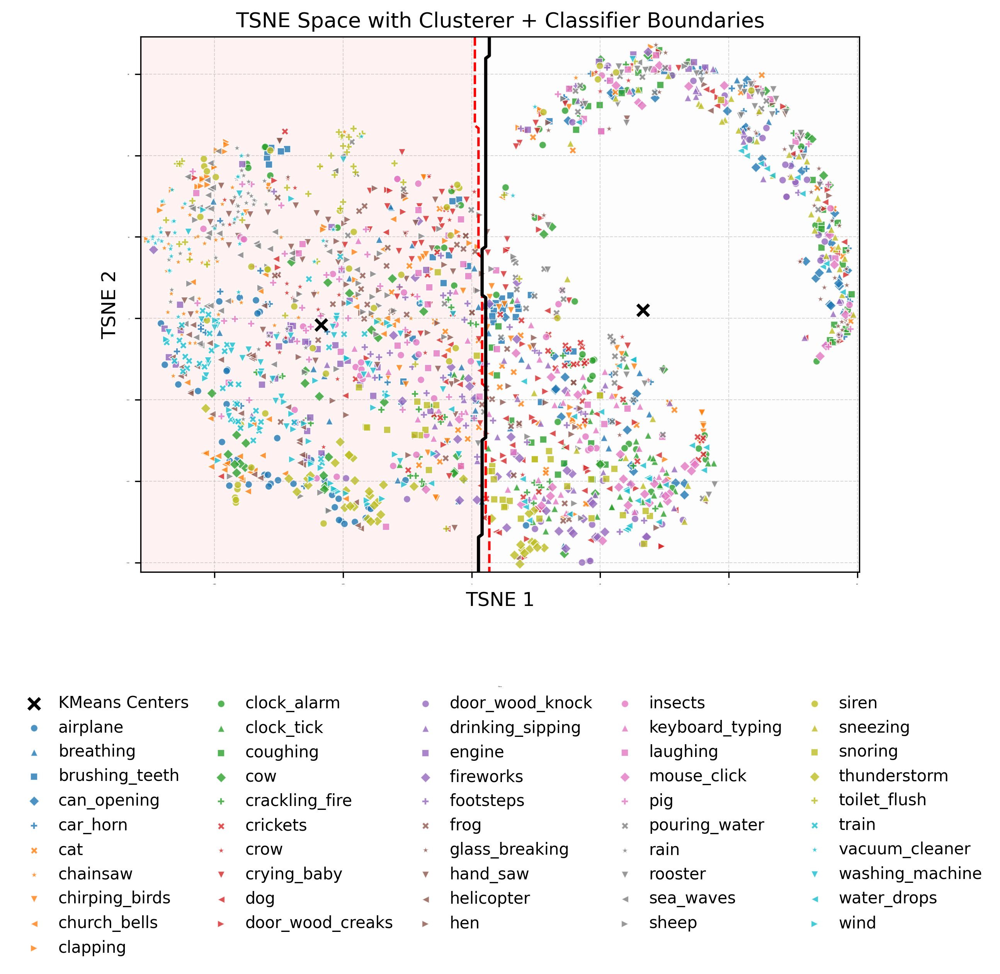

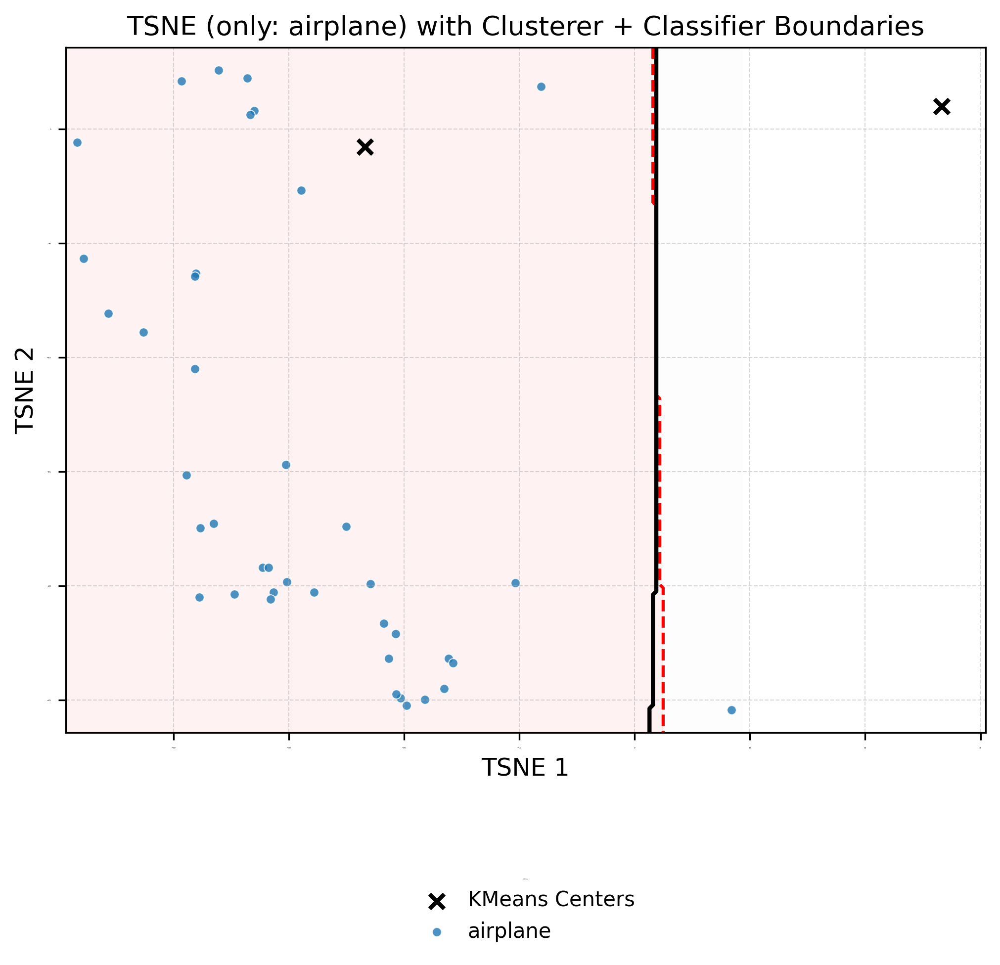

(<Figure size 2400x1800 with 1 Axes>,
 <Axes: title={'center': 'TSNE (only: airplane) with Clusterer + Classifier Boundaries'}, xlabel='TSNE 1', ylabel='TSNE 2'>)

In [9]:
# 2) 定义你要试的多态组合
# projector
pca_2d = PCA(n_components=2)
data_length = len(X_300d)
effective_perplexity = min(30, max(5, (data_length - 1) // 3))
tsne_2d = TSNE(
    n_components=2,
    random_state=42,
    max_iter=1000,
    perplexity=effective_perplexity,
    init='pca',
    learning_rate='auto',
)

# clusterer（举例：GMM / KMeans）
gmm2 = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
kmeans2 = KMeans(n_clusters=2, random_state=42, n_init="auto")

# classifier（举例：LogReg / SVC / LinearSVC / Poly-LR）
logreg = sklearn.linear_model.LogisticRegression(max_iter=1000)

# SVC 要概率就 probability=True；否则会走 decision_function+sigmoid 近似
svm_rbf = SVC(kernel="rbf", probability=True)
svm_linear = LinearSVC()

poly_logreg = Pipeline([
    ("poly", PolynomialFeatures(degree=3, include_bias=False)),
    ("lr", sklearn.linear_model.LogisticRegression(max_iter=2000)),
])

# Projection + Clustering + Classifiction
latent_exp = LatentSpaceExperiment(projector=tsne_2d, base_clusterer=kmeans2, classifier=svm_rbf).fit(X_300d)
projection_out = latent_exp.predict_table(latent_df)
csv_path_projection = latent_exp.save_csv(projection_out, autoencoder_type=autoencoder_type, save_dir=Path("."))

# Visualization: Single / All class
latent_exp.visualize_all_classes(y)
latent_exp.visualize_single_class(latent_df, class_name="airplane")



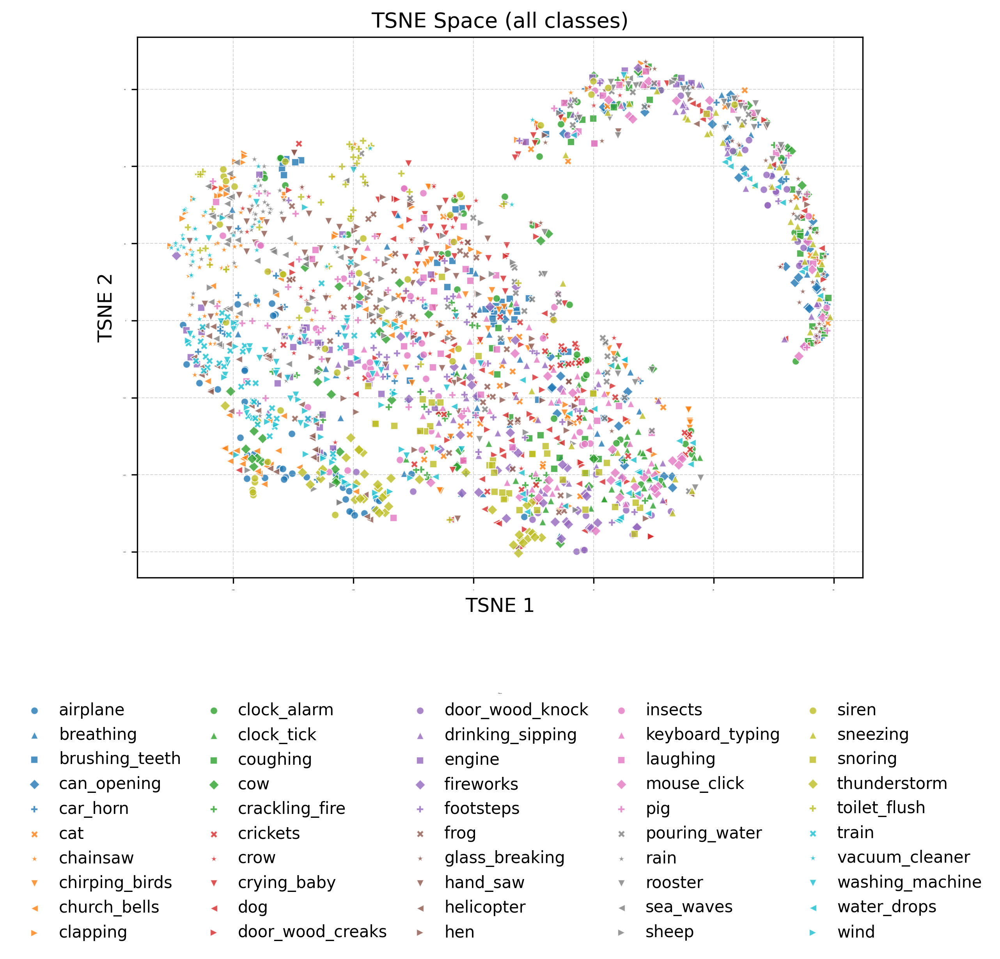

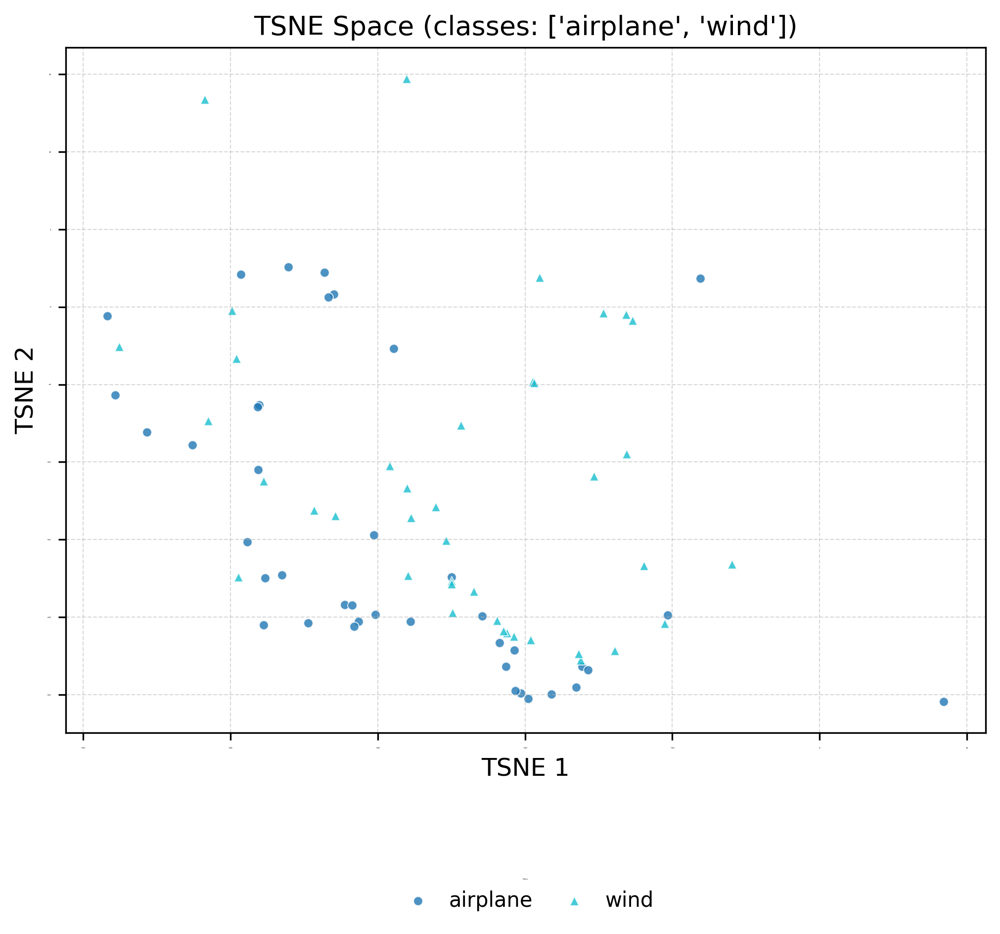

(<Figure size 2400x1800 with 1 Axes>,
 <Axes: title={'center': "TSNE Space (classes: ['airplane', 'wind'])"}, xlabel='TSNE 1', ylabel='TSNE 2'>)

In [10]:
# 1) 全部类别（无边界）
latent_exp.visualize_classes(latent_df, classes="all")

# 2) 只看指定类别（无边界）
latent_exp.visualize_classes(latent_df, classes=["airplane", "wind"])



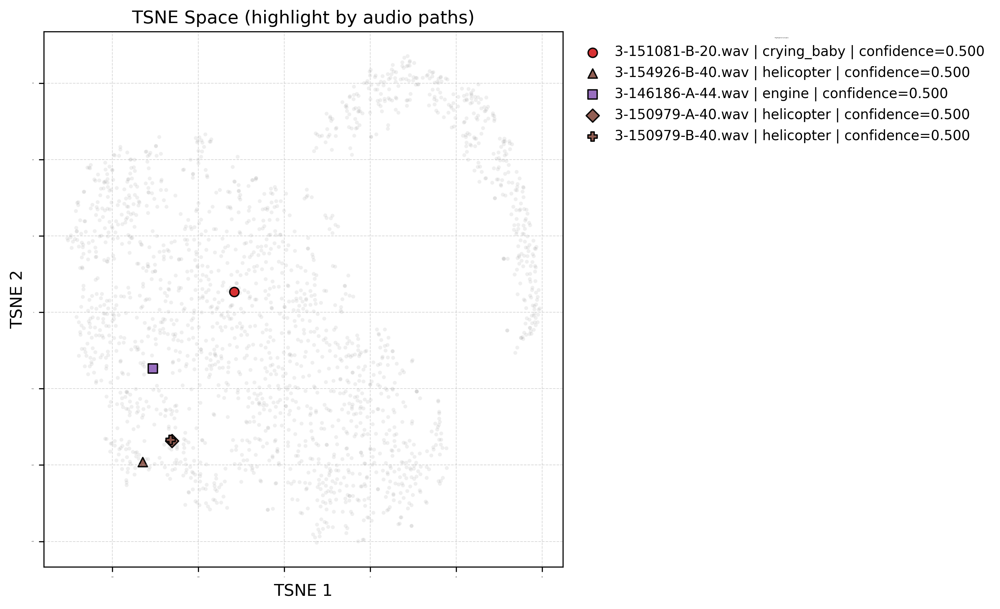

(<Figure size 3000x1800 with 1 Axes>,
 <Axes: title={'center': 'TSNE Space (highlight by audio paths)'}, xlabel='TSNE 1', ylabel='TSNE 2'>)

In [11]:
# 3) 按音频路径定位/高亮样本（无边界
some_paths = (projection_out[projection_out["cluster"] == 0]
              .sort_values("confidence", ascending=False)
              .head(5)["path"].tolist()) # cluster 内最典型
latent_exp.visualize_by_paths(latent_df, some_paths, out_df=projection_out, show_all_background=True, annotate=False, s_bg=8, s_hi=45)

In [12]:
def listen_topN(out_df: pd.DataFrame, n=10, cluster_id=None, sort_by="confidence", ascending=False, show_info=True):
    """
    sort_by: "confidence"（推荐）或 "prob_pred" 或 "p1" 或 "p0"
    ascending: False 表示取最大的（最典型/最自信）
    """
    d = out_df.copy()
    if cluster_id is not None:
        d = d[d["cluster"] == cluster_id]

    if sort_by not in d.columns:
        raise ValueError(f"sort_by='{sort_by}' not in columns: {list(d.columns)}")

    d = d.sort_values(sort_by, ascending=ascending).head(n)

    for i, r in enumerate(d.itertuples(index=False), 1):
        p = r.path
        lab = r.original_label
        c = r.cluster

        info = f"[{i:02d}] cluster={c} label={lab} file={Path(p).name}"
        if show_info:
            if "prob_pred" in d.columns:
                info += f" prob_pred={getattr(r,'prob_pred',np.nan):.4f}"
            if "confidence" in d.columns:
                info += f" conf={getattr(r,'confidence',np.nan):.4f}"
            if "p0" in d.columns and "p1" in d.columns:
                info += f" (p0={getattr(r,'p0',np.nan):.3f}, p1={getattr(r,'p1',np.nan):.3f})"
            print(info)

        display(Audio(p))

    return d

# 示例：听 cluster=0 最典型的 top10
top10_df = listen_topN(projection_out, n=10, cluster_id=0, sort_by="confidence", ascending=False)

[01] cluster=0 label=crying_baby file=3-151081-B-20.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[02] cluster=0 label=helicopter file=3-154926-B-40.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[03] cluster=0 label=engine file=3-146186-A-44.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[04] cluster=0 label=helicopter file=3-150979-A-40.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[05] cluster=0 label=helicopter file=3-150979-B-40.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[06] cluster=0 label=helicopter file=3-150979-C-40.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[07] cluster=0 label=cow file=3-152039-A-3.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[08] cluster=0 label=laughing file=3-152997-A-26.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[09] cluster=0 label=engine file=3-154758-A-44.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


[10] cluster=0 label=car_horn file=3-155130-A-43.wav prob_pred=1.0000 conf=0.5000 (p0=1.000, p1=0.000)


In [13]:
top10_df = listen_topN(projection_out, n=10, cluster_id=1, ascending=False)

[01] cluster=1 label=helicopter file=4-161579-A-40.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[02] cluster=1 label=snoring file=2-110417-A-28.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[03] cluster=1 label=crickets file=4-171823-A-13.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[04] cluster=1 label=door_wood_creaks file=5-177779-A-33.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[05] cluster=1 label=brushing_teeth file=5-180229-A-27.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[06] cluster=1 label=crickets file=3-134802-A-13.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[07] cluster=1 label=door_wood_creaks file=5-181458-A-33.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[08] cluster=1 label=coughing file=5-184871-A-24.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[09] cluster=1 label=coughing file=4-171396-A-24.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


[10] cluster=1 label=crackling_fire file=5-189237-A-12.wav prob_pred=1.0000 conf=0.5000 (p0=0.000, p1=1.000)


In [14]:
@torch.no_grad()
def compute_lowlevel_features(
    wav: torch.Tensor,
    mel_transform=to_latent.mel_transform,                # to_latent.mel_transform
    sr_target=16000,
    rolloff_pct=0.85,
    silence_db=-40.0,
    frame_ms=25.0,
    hop_ms=10.0,
):
    """
    wav: (C,T) or (T,)
    mel_transform: to_latent.mel_transform (含 resample+fixlen+melspec+to_db)
    返回 dict: rms / crest / zcr / centroid_hz / rolloff_hz / flatness / silence_ratio
    """
    eps = 1e-12

    # ---- 1) 走同一套 mel_transform 得到 log-mel(dB)
    x = wav.to(device)
    if x.dim() == 1:
        x = x.unsqueeze(0)              # (1,T)
    if x.size(0) > 1:
        x = x.mean(dim=0, keepdim=True) # mix to mono -> (1,T)

    # mel_transform 期望 batch 还是单样本不确定，这里都兼容
    mel_db = mel_transform(x)  # (1,80,frames) 或 (80,frames) 或 (B,80,frames)

    if mel_db.dim() == 2:
        mel_db = mel_db.unsqueeze(0)    # (1,80,F)
    elif mel_db.dim() == 3 and mel_db.size(0) != 1:
        # 如果传入 batch，这里只处理第一条（你外层通常逐条算）
        mel_db = mel_db[:1]

    # ---- 2) 对齐后的 waveform：取 mel_transform 内部 fixed-length/resample 的结果
    # 无法直接拿到中间结果时：用 mel_db 的帧数推回 waveform 分帧即可；时间域特征在固定 5s 上算即可。
    # 这里采用：直接对 x 做“等价的 fixed-length/resample”会更理想，但 mel_transform 内部不一定暴露。
    # 所以时间域特征：用 mel_transform.resample + time_fixer（如果存在）来得到对齐 waveform。
    x_aligned = x
    if hasattr(mel_transform, "resample"):
        x_aligned = mel_transform.resample(x_aligned)
    if hasattr(mel_transform, "time_fixer"):
        x_aligned = mel_transform.time_fixer(x_aligned)
    # x_aligned: (1,T16k_fixed)

    wav1d = x_aligned.squeeze(0).float()  # (T,)
    rms = torch.sqrt(torch.mean(wav1d * wav1d) + eps).item()
    peak = torch.max(torch.abs(wav1d)).item()
    crest = float(peak / (rms + eps))

    # framing for ZCR & silence_ratio
    frame_len = int(sr_target * frame_ms / 1000.0)
    hop_len = int(sr_target * hop_ms / 1000.0)
    frame_len = max(32, frame_len)
    hop_len = max(16, hop_len)

    if wav1d.numel() < frame_len:
        wav1d = torch.nn.functional.pad(wav1d, (0, frame_len - wav1d.numel()))

    frames = wav1d.unfold(0, frame_len, hop_len)  # (n_frames, frame_len)

    sign = torch.sign(frames)
    sign[sign == 0] = 1
    zc = (sign[:, 1:] * sign[:, :-1] < 0).float().mean(dim=1)
    zcr = zc.mean().item()

    frame_rms = torch.sqrt(torch.mean(frames * frames, dim=1) + eps)
    thr = 10 ** (silence_db / 20.0)
    silence_ratio = (frame_rms < thr).float().mean().item()

    # ---- 3) mel 域谱特征：centroid/rolloff/flatness
    # mel_db 是 dB：先转回线性幅度/功率域做这些统计更合理
    mel_db = mel_db.squeeze(0)           # (80,F)
    mel_amp = torch.pow(10.0, mel_db / 20.0)  # amplitude
    mel_pow = mel_amp * mel_amp + eps         # power, (80,F)

    # 频率轴：用 mel filter 的中心频率（Hz）
    # torchaudio 的 MelSpectrogram 里一般能取到 n_mels/sample_rate/f_min/f_max
    # 这里尽量从 mel_transform.melspec 里取参数，取不到就退化为线性 0~sr/2
    if hasattr(mel_transform, "melspec") and hasattr(mel_transform.melspec, "mel_scale"):
        ms = mel_transform.melspec
        n_mels = int(getattr(ms, "n_mels", mel_pow.size(0)))
    
        f_min = getattr(ms, "f_min", 0.0)
        f_max = getattr(ms, "f_max", None)
    
        f_min = float(0.0 if f_min is None else f_min)
        f_max = float((sr_target / 2) if f_max is None else f_max)
    
        freqs = torch.linspace(f_min, f_max, n_mels, device=mel_pow.device)
    else:
        freqs = torch.linspace(0, sr_target / 2, mel_pow.size(0), device=mel_pow.device)


    # centroid per frame then mean
    centroid = (mel_pow * freqs[:, None]).sum(dim=0) / (mel_pow.sum(dim=0) + eps)
    centroid_hz = centroid.mean().item()

    # rolloff per frame then mean
    cumsum = torch.cumsum(mel_pow, dim=0)
    total = mel_pow.sum(dim=0, keepdim=True)
    target = rolloff_pct * total
    idx = (cumsum >= target).float().argmax(dim=0)   # (F,)
    rolloff_hz = freqs[idx].mean().item()

    # flatness per frame then mean (geo/arithmetic)
    geo = torch.exp(torch.log(mel_pow).mean(dim=0))
    arith = mel_pow.mean(dim=0)
    flatness = (geo / (arith + eps)).mean().item()

    return {
        "rms": rms,
        "crest": crest,
        "zcr": zcr,
        "centroid_hz": centroid_hz,
        "rolloff_hz": rolloff_hz,
        "flatness": flatness,
        "silence_ratio": silence_ratio,
    }

def topN_features_from_cluster(
    out_df: pd.DataFrame,
    cluster_id=1,
    n=20,
    sort_by="confidence",   # 或 "prob_pred"
    highest=True,
    mel_transform=None,     # to_latent.mel_transform
):
    if mel_transform is None:
        raise ValueError("pass mel_transform=to_latent.mel_transform")

    d = out_df[out_df["cluster"] == cluster_id].copy()
    d = d.sort_values(sort_by, ascending=not highest).head(n)

    rows = []
    for r in d.itertuples(index=False):
        wav, sr = torchaudio.load(r.path)
        feats = compute_lowlevel_features(wav, mel_transform=mel_transform)

        row = {
            "path": r.path,
            "original_label": r.original_label,
            "cluster": r.cluster,
        }
        for k in ["p0", "p1", "prob_pred", "confidence", "margin"]:
            if hasattr(r, k):
                row[k] = getattr(r, k)
        row.update(feats)
        rows.append(row)

    return pd.DataFrame(rows)
mel_t = to_latent.mel_transform.to(device).eval()
# 用法
feat_df0 = topN_features_from_cluster(projection_out, cluster_id=0, n=30, sort_by="confidence", mel_transform=mel_t)
feat_df1 = topN_features_from_cluster(projection_out, cluster_id=1, n=30, sort_by="confidence", mel_transform=mel_t)

In [15]:
feat_df0

,path,original_label,cluster,p0,p1,prob_pred,confidence,margin,rms,crest,zcr,centroid_hz,rolloff_hz,flatness,silence_ratio
0,data/ESC-50-master/audio/3-151081-B-20.wav,crying_baby,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.119697,7.444521,0.116954,2237.172607,2745.092041,0.076038,0.208835
1,data/ESC-50-master/audio/3-154926-B-40.wav,helicopter,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.115239,6.505609,0.075118,1354.265747,2294.752441,0.049259,0.014056
2,data/ESC-50-master/audio/3-146186-A-44.wav,engine,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.221192,2.965532,0.027614,366.860962,437.201538,0.016123,0.000000
3,data/ESC-50-master/audio/3-150979-A-40.wav,helicopter,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.153247,5.615885,0.027408,593.286011,981.934875,0.010456,0.000000
4,data/ESC-50-master/audio/3-150979-B-40.wav,helicopter,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.166412,5.145450,0.029944,670.078735,1052.073120,0.015143,0.000000
5,data/ESC-50-master/audio/3-150979-C-40.wav,helicopter,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.139647,5.785716,0.031681,762.281982,1141.211182,0.009962,0.000000
6,data/ESC-50-master/audio/3-152039-A-3.wav,cow,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.243617,4.154154,0.096421,1825.897461,2826.347412,0.063193,0.000000
7,data/ESC-50-master/audio/3-152997-A-26.wav,laughing,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.204809,5.164384,0.064589,1114.547485,1615.806396,0.050013,0.000000
8,data/ESC-50-master/audio/3-154758-A-44.wav,engine,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.030836,4.889951,0.140718,2148.892822,3442.835938,0.323643,0.000000
9,data/ESC-50-master/audio/3-155130-A-43.wav,car_horn,0,1.0,1.000000e-07,1.0,0.5,-0.5,0.050801,10.051998,0.082807,1235.033447,2151.040039,0.102426,0.024096


In [16]:
feat_df1

,path,original_label,cluster,p0,p1,prob_pred,confidence,margin,rms,crest,zcr,centroid_hz,rolloff_hz,flatness,silence_ratio
0,data/ESC-50-master/audio/4-161579-A-40.wav,helicopter,1,3.000001e-14,1.0,1.0,0.5,0.5,0.034163,16.699184,0.025455,2858.415771,4780.110840,0.626884,0.650602
1,data/ESC-50-master/audio/2-110417-A-28.wav,snoring,1,3.000001e-14,1.0,1.0,0.5,0.5,0.006035,12.468236,0.082692,801.494812,1375.679199,0.083120,0.893574
2,data/ESC-50-master/audio/4-171823-A-13.wav,crickets,1,3.000001e-14,1.0,1.0,0.5,0.5,0.004696,4.655250,0.355663,5100.721680,5476.237305,0.051098,1.000000
3,data/ESC-50-master/audio/5-177779-A-33.wav,door_wood_creaks,1,3.000001e-14,1.0,1.0,0.5,0.5,0.011276,23.696909,0.067830,1578.793701,2463.933105,0.181187,0.674699
4,data/ESC-50-master/audio/5-180229-A-27.wav,brushing_teeth,1,3.000001e-14,1.0,1.0,0.5,0.5,0.009474,21.023693,0.239152,3239.227051,5442.077637,0.132761,0.676707
5,data/ESC-50-master/audio/3-134802-A-13.wav,crickets,1,3.000001e-14,1.0,1.0,0.5,0.5,0.030923,8.026494,0.509431,6028.473145,6448.268066,0.061997,0.329317
6,data/ESC-50-master/audio/5-181458-A-33.wav,door_wood_creaks,1,3.000001e-14,1.0,1.0,0.5,0.5,0.012165,6.724261,0.095897,1710.422852,2545.794434,0.091968,0.851406
7,data/ESC-50-master/audio/5-184871-A-24.wav,coughing,1,3.000001e-14,1.0,1.0,0.5,0.5,0.133819,7.978834,0.121670,2466.809082,3794.739502,0.304441,0.493976
8,data/ESC-50-master/audio/4-171396-A-24.wav,coughing,1,3.000001e-14,1.0,1.0,0.5,0.5,0.051080,15.342643,0.107417,1896.005249,2825.943115,0.160775,0.682731
9,data/ESC-50-master/audio/5-189237-A-12.wav,crackling_fire,1,3.000001e-14,1.0,1.0,0.5,0.5,0.003999,68.295325,0.100925,1746.166870,2524.571045,0.144485,0.979920
